[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/dimitrisdais/generative-ai-lab/blob/main/notebooks/zero_few_shot_pokemon_detection_with_vlms.ipynb)

# 🎮 Catching Them All: Zero and Few-Shot Pokémon Detection with VLMs

👋 Hi, I am [**Dimitris Dais**](https://www.linkedin.com/in/dimitris-dais/), an engineer passionate about exploring and applying Generative AI and multimodal LLMs through hands-on experimentation.

This notebook explores how to detect and classify Pokémon using zero- and few-shot learning with vision-language models like CLIP, Grounding DINO, and OWLv2.  

- **Step 1: Zero-Shot Classification with CLIP**  
- **Step 2: Few-Shot Classification with CLIP Prototypes**  
- **Step 3: Dataset Expansion via Web Search**  
- **Step 4: Zero-Shot Object Detection with Grounding DINO**  
- **Step 5: Zero-Shot Object Detection with OWLv2**  

For more explanation, refer to the [corresponding blog](https://dimitrisdais.github.io/dimitris-dais.github.io/blogs/zero_few_shot_pokemon_detection_with_vlms/).  

Enjoyed it? Reuse or expand it — and feel free to connect.

🔗 **Website**: [dimitrisdais.github.io](https://dimitrisdais.github.io/dimitris-dais.github.io/)  
📬 **Contact**: dimitris.dais.phd@gmail.com  
🐙 **GitHub**: [@dimitrisdais](https://github.com/dimitrisdais)  
🔗 **LinkedIn**: [linkedin.com/in/dimitris-dais](https://www.linkedin.com/in/dimitris-dais/)  
▶️ **YouTube**: [youtube.com/@dimitrisdais](https://www.youtube.com/channel/UCuSdAarhISVQzV2GhxaErsg)

![Automatic Pokémon Identification.](https://raw.githubusercontent.com/dimitrisdais/generative-ai-lab/main/assets/images/pokemon_identification.gif)

## 🔧 Install Required Packages

In [ ]:
!pip install duckduckgo-search

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 33.2 MB/s eta 0:00:00


In [ ]:
import torch
import transformers

print("🧠 PyTorch version:", torch.__version__)
print("🧱 Transformers version:", transformers.__version__)

## ⚙️ Check for GPU Availability

This step checks whether a GPU is available in the current Colab environment and assigns the appropriate device (`"cuda"` for GPU or `"cpu"` otherwise).  
Using a GPU can significantly speed up model inference for image and audio generation.

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print("device", device)

## 🔗 Mount Google Drive

This step connects your Google Drive to the Colab notebook so that we can save and access files like generated images, audio, and videos.

➡️ A pop-up will appear asking you to **authorize** access — click the link, choose your Google account, and copy the authorization code back into the notebook when prompted

![Mount Google Drive](https://raw.githubusercontent.com/dimitrisdais/generative-ai-lab/main/assets/images/mount_google_drive.png)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 🎬 Video Preparation: Frame Extraction from the Pokémon Intro

A short Pokémon intro video (~1 minute) was sourced from [Archive.org](https://archive.org) and downloaded from the link below:

🔗 https://ia902305.us.archive.org/35/items/twitter-1421216532307267595/1421216532307267595.mp4

- 📂 The video was uploaded to Google Drive for convenient access within the notebook.
- 🖼️ To enable frame-level processing, the video was decomposed into individual `.png` image frames.
- 🚀 This preprocessing step allows for **faster, more flexible** analysis during classification and detection—without reloading the video each time.

The extracted frames serve as the foundation for all subsequent experiments.

In [ ]:
import os

video_path = "/content/drive/MyDrive/datasets/1421216532307267595.mp4"

# Output folder in Drive to store extracted frames
frame_output_dir = "/content/drive/MyDrive/datasets/video_frames"
os.makedirs(frame_output_dir, exist_ok=True)

In [ ]:
import cv2

# Open video file
cap = cv2.VideoCapture(video_path)

# Get video metadata
fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

print(f"🎥 Video FPS: {fps}")
print(f"🎞️ Total frames in video: {total_frames}")

frame_idx = 0
extracted_count = 0

# Read and save each frame
while cap.isOpened():
    success, frame = cap.read()
    if not success:
        break

    filename = f"{frame_idx:06}.png"
    full_path = os.path.join(frame_output_dir, filename)
    cv2.imwrite(full_path, frame)

    if frame_idx % 200 == 0:
        print(f"✅ Saved frame {frame_idx}")

    frame_idx += 1
    extracted_count += 1

cap.release()

print(f"\n✅ Done! Extracted {extracted_count} frames from the video.")
print(f"📁 Saved in: {frame_output_dir}")

## Step 1: 🧠 Zero-Shot Classification with CLIP

In this step, we apply **OpenAI's CLIP** model to perform zero-shot classification on selected video frames.

- The model compares each frame's visual embedding to a set of **textual class prompts** (e.g., `"Pikachu"`, `"Charmander"`).
- 🔗 CLIP then selects the class with the **highest semantic similarity** to the image.
- 🏷️ Class similarity scores are shown above each frame.
- ➡️ The top prediction is marked with an arrow to highlight the most confident match.

This approach allows classification without any training—relying purely on the model's pre-learned visual-language alignment.

In [ ]:
from transformers import CLIPProcessor, CLIPModel

model_id = "openai/clip-vit-base-patch32"

clip_model = CLIPModel.from_pretrained(model_id).to(device)

clip_processor = CLIPProcessor.from_pretrained(model_id)

config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import math

def run_clip_zero_shot_on_frames(frame_paths, prompts, clip_model, clip_processor, device="cuda"):
    """
    Run zero-shot classification on multiple frames and display results in a grid.

    Args:
        frame_paths (list of str): List of image paths.
        prompts (list of str): List of text prompts.
        clip_model: CLIP model.
        clip_processor: CLIP processor.
        device (str): Device to run on ("cuda" or "cpu").
    """
    num_images = len(frame_paths)
    ncols = 2
    nrows = math.ceil(num_images / ncols)

    fig, axs = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=(ncols * 6, nrows * 4),
        squeeze=False,
        gridspec_kw={'hspace': 0.05}
    )
    axs = axs.flatten()

    for idx, frame_path in enumerate(frame_paths):
        frame = Image.open(frame_path).convert("RGB")
        image_inputs = clip_processor(images=frame, return_tensors="pt").to(device)
        text_inputs = clip_processor(text=prompts, return_tensors="pt", padding=True).to(device)

        with torch.no_grad():
            image_embedding = clip_model.get_image_features(**image_inputs)
            image_embedding = image_embedding / image_embedding.norm(dim=-1, keepdim=True)
            text_embeddings = clip_model.get_text_features(**text_inputs)
            text_embeddings = text_embeddings / text_embeddings.norm(dim=-1, keepdim=True)

        similarities = (image_embedding @ text_embeddings.T)[0]
        sorted_indices = torch.argsort(similarities, descending=True)
        top_idx = sorted_indices[0].item()

        # Format title
        title_parts = []
        for i, label in enumerate(prompts):
            score = similarities[i].item()
            prefix = "➡️ " if i == top_idx else ""
            part = f"{prefix}{label}: {score:.2f}"
            title_parts.append(part)
        title = " | ".join(title_parts)

        # Plot
        ax = axs[idx]
        ax.imshow(frame)
        ax.axis("off")
        ax.set_title(title, fontsize=10, color='darkblue')

    # Hide unused subplots
    for j in range(idx + 1, len(axs)):
        axs[j].axis("off")

    plt.subplots_adjust(hspace=0)
    plt.show()

**📊 Observations from Zero-Shot Classification Results**  

- In the top two rows, the model correctly classifies the visible Pokémon in each frame using zero-shot CLIP.  

- Limited to predicting a single class, even when multiple Pokémon are clearly visible (e.g., the fourth image).

- In the bottom row, where none of the prompted Pokémon appear, the model makes incorrect predictions—likely influenced by dominant colors (e.g., blue areas are often labeled as Squirtle, and red/orange areas as Charmander).

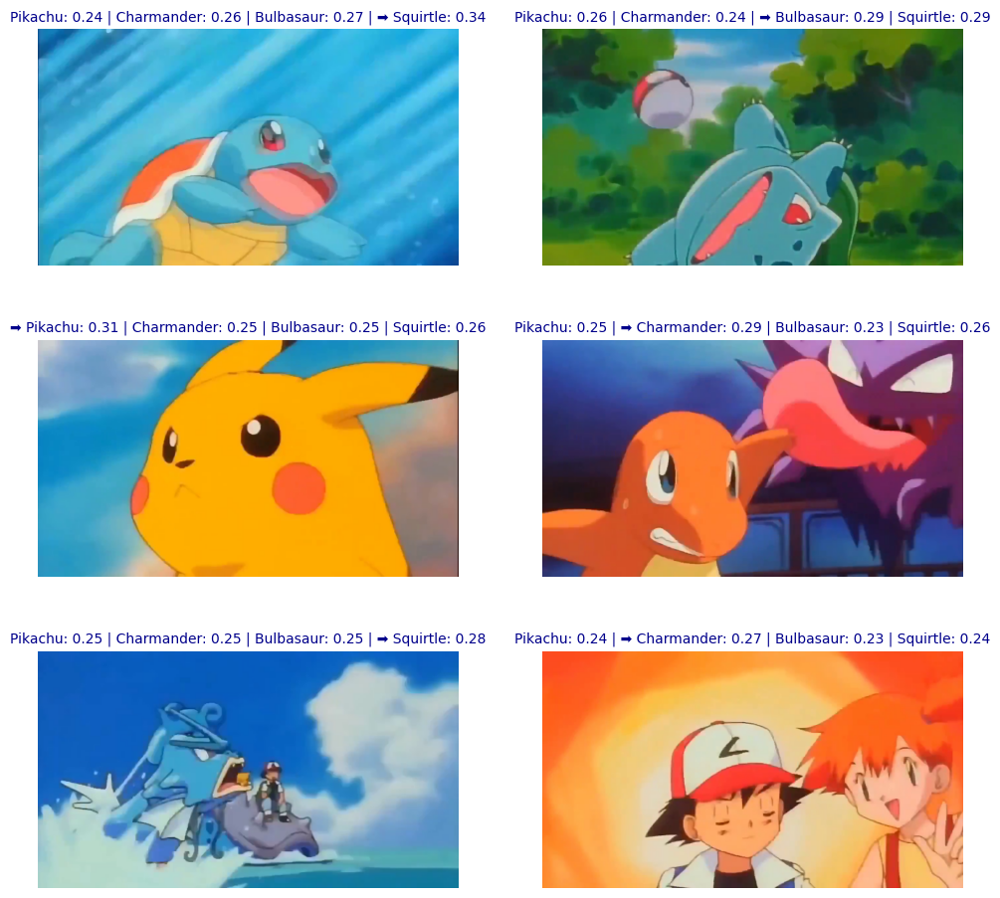

In [ ]:
frame_list = [
    "/content/drive/MyDrive/datasets/video_frames/000226.png",
    "/content/drive/MyDrive/datasets/video_frames/000270.png",
    "/content/drive/MyDrive/datasets/video_frames/001325.png",
    "/content/drive/MyDrive/datasets/video_frames/000390.png",
    "/content/drive/MyDrive/datasets/video_frames/000590.png",
    "/content/drive/MyDrive/datasets/video_frames/000925.png"
]

prompts = ["Pikachu", "Charmander", "Bulbasaur", "Squirtle"]

run_clip_zero_shot_on_frames(frame_list, prompts, clip_model, clip_processor, device="cuda")

The following example combines four individual frames—each containing a different Pokémon—into a single composite image. While each Pokémon is clearly visible, the model can only predict one label. The prediction (Charmander) reflects the dominant region or strongest feature, but highlights CLIP's limitation in handling multi-object scenes during zero-shot classification.

✅ Composite image saved to: /content/drive/MyDrive/datasets/video_frames/composite_multi_pokemon.png


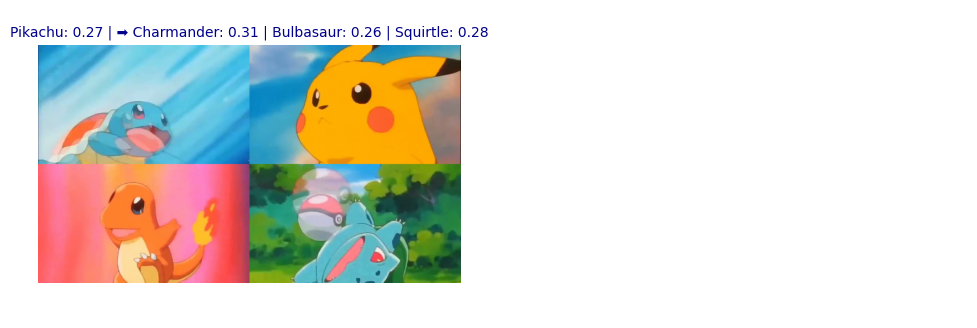

In [ ]:
from pathlib import Path

# List of input frame paths (make sure they exist!)
frame_names = ["000223", "001325", "000586", "000261"]
frame_dir = Path("/content/drive/MyDrive/datasets/video_frames")
output_path = frame_dir / "composite_multi_pokemon.png"

# Load and downscale each image
frames = []
for name in frame_names:
    path = frame_dir / f"{name}.png"
    img = Image.open(path).convert("RGB")
    # Downscale to 1/2 width and height (1/4 area)
    img = img.resize((img.width // 2, img.height // 2))
    frames.append(img)

# Combine into 2x2 grid
new_img = Image.new("RGB", (frames[0].width * 2, frames[0].height * 2))

new_img.paste(frames[0], (0, 0))
new_img.paste(frames[1], (frames[0].width, 0))
new_img.paste(frames[2], (0, frames[0].height))
new_img.paste(frames[3], (frames[0].width, frames[0].height))

# Resize back to original single frame size
original_frame = Image.open(frame_dir / f"{frame_names[0]}.png")
new_img = new_img.resize(original_frame.size)

# Save to disk
new_img.save(output_path)
print(f"✅ Composite image saved to: {output_path}")

run_clip_zero_shot_on_frames(
    frame_paths=["/content/drive/MyDrive/datasets/video_frames/composite_multi_pokemon.png"],
    prompts=["Pikachu", "Charmander", "Bulbasaur", "Squirtle"],
    clip_model=clip_model,
    clip_processor=clip_processor,
    device="cuda"
)

## Step 2: 🧪 Few-Shot Classification with CLIP Prototypes

To go beyond zero-shot limitations, we adopt a **few-shot classification** strategy using a labeled Pokémon dataset from [Kaggle](https://www.kaggle.com/datasets/lantian773030/pokemonclassification), containing ~50 images per class.

- 📁 The dataset was uploaded to Google Drive for easy access within the notebook.
- 🎯 A subset of Pokémon classes was selected—focused on characters visible in the test video.
- 🧠 For each class, **CLIP embeddings** are computed and averaged to create a class-level **prototype**.
- 🆚 During inference, new video frames are classified by comparing their embeddings to these prototypes using **cosine similarity**.

This method improves prediction accuracy while requiring only a handful of labeled examples per class.

In [ ]:
import random

# Set the base dataset path (adjust if your folder structure differs)
base_path = Path("/content/drive/MyDrive/datasets/PokemonData")

# Pick common Pokémon (ensure these folders exist)
selected_pokemon = [
    "Pikachu", "Bulbasaur", "Charmander", "Squirtle",
    "Arcanine", "Rapidash", "Gyarados", "Lapras",
    "Onix", "Meowth", "Blastoise", "Charizard",
    "Haunter", "Mew", "Mewtwo", "Pidgeotto"
]

In [ ]:
# Set the max number of images to load per Pokémon (-1 = all)
max_images = -1

# Dictionary to store image paths
pokemon_image_paths = {}

# Load image paths per selected Pokémon
for name in selected_pokemon:
    folder = base_path / name
    if not folder.exists():
        print(f"❌ Folder not found: {folder}")
        continue

    image_files = []
    for ext in ("*.png", "*.jpg", "*.jpeg", "*.gif", "*.bmp", "*.webp"):
        image_files.extend(folder.glob(ext))

    num_found = len(image_files)

    # Determine how many to include
    if max_images == -1 or num_found <= max_images:
        selected_files = image_files
    else:
        selected_files = random.sample(image_files, max_images)

    pokemon_image_paths[name] = selected_files
    print(f"📁 Found {num_found} image(s) | ✅ Collected {len(selected_files)} path(s) for {name}")

📁 Found 62 image(s) | ✅ Collected 62 path(s) for Pikachu
📁 Found 41 image(s) | ✅ Collected 41 path(s) for Bulbasaur
📁 Found 51 image(s) | ✅ Collected 51 path(s) for Charmander
📁 Found 52 image(s) | ✅ Collected 52 path(s) for Squirtle
📁 Found 41 image(s) | ✅ Collected 41 path(s) for Arcanine
📁 Found 48 image(s) | ✅ Collected 48 path(s) for Rapidash
📁 Found 46 image(s) | ✅ Collected 46 path(s) for Gyarados
📁 Found 53 image(s) | ✅ Collected 53 path(s) for Lapras
📁 Found 42 image(s) | ✅ Collected 42 path(s) for Onix
📁 Found 26 image(s) | ✅ Collected 26 path(s) for Meowth
📁 Found 42 image(s) | ✅ Collected 42 path(s) for Blastoise
📁 Found 35 image(s) | ✅ Collected 35 path(s) for Charizard
📁 Found 48 image(s) | ✅ Collected 48 path(s) for Haunter
📁 Found 54 image(s) | ✅ Collected 54 path(s) for Mew
📁 Found 52 image(s) | ✅ Collected 52 path(s) for Mewtwo
📁 Found 40 image(s) | ✅ Collected 40 path(s) for Pidgeotto


Display example images from the dataset.

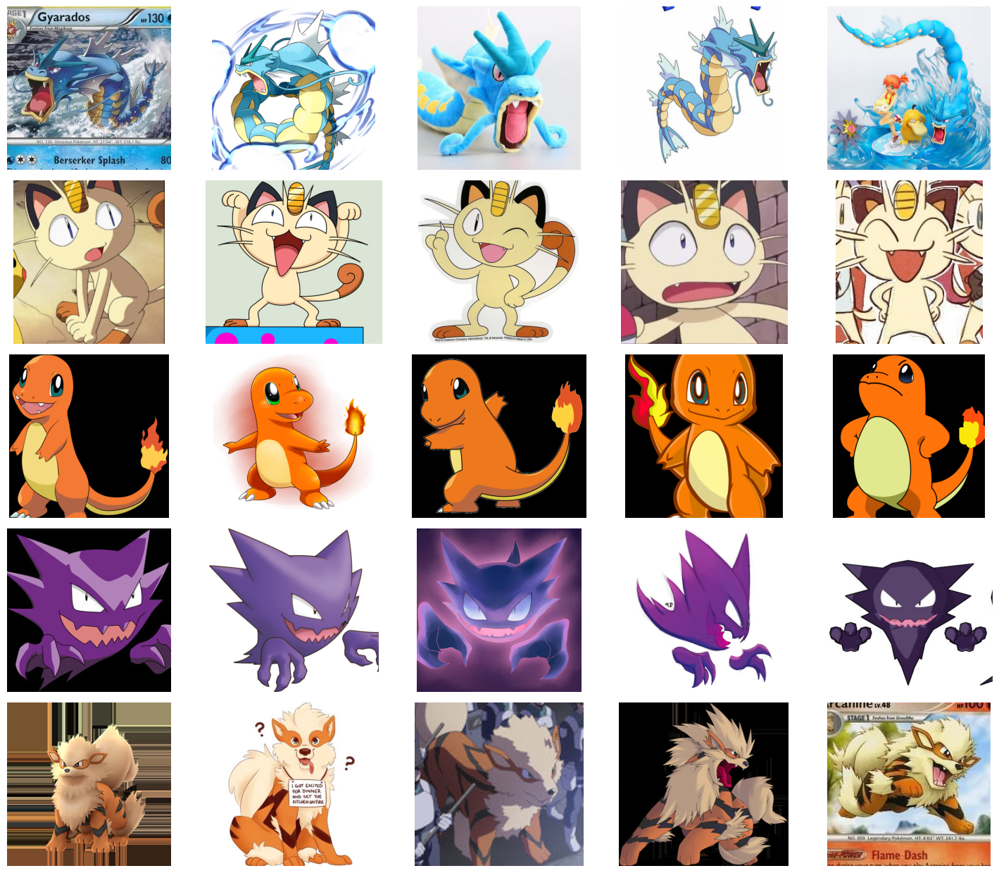

In [ ]:
# Select up to 5 Pokémon to display
num_to_show = 5
sampled_pokemon = random.sample(list(pokemon_image_paths.keys()), k=min(num_to_show, len(pokemon_image_paths)))
n_cols = 5

# Create subplot grid
fig, axs = plt.subplots(len(sampled_pokemon), n_cols, figsize=(n_cols * 3, len(sampled_pokemon) * 2.5))

for row, name in enumerate(sampled_pokemon):
    img_paths = pokemon_image_paths[name]
    for col in range(n_cols):
        ax = axs[row, col] if len(sampled_pokemon) > 1 else axs[col]
        ax.axis("off")
        if col < len(img_paths):
            try:
                img = Image.open(img_paths[col]).convert("RGB")
                ax.imshow(img)
            except Exception as e:
                print(f"⚠️ Could not load {img_paths[col]}: {e}")
        if col == 0:
            ax.set_ylabel(name, fontsize=10, rotation=0, labelpad=30, va='center')

plt.tight_layout()
plt.show()

CLIP is used to extract image embeddings for each labeled Pokémon in the dataset. These embeddings will later be averaged to form class prototypes for few-shot classification.

In [ ]:
# Lists to store embeddings and labels
clip_embeddings = []
clip_labels = []

print("🔄 Extracting CLIP embeddings...")

for label, img_paths in pokemon_image_paths.items():
    for path in img_paths:
        try:
            img = Image.open(path).convert("RGB")
            inputs = clip_processor(images=img, return_tensors="pt").to(device)
            with torch.no_grad():
                features = clip_model.get_image_features(**inputs)
                features = features / features.norm(p=2, dim=-1, keepdim=True)  # Normalize
            clip_embeddings.append(features.cpu())
            clip_labels.append(label)
        except Exception as e:
            print(f"⚠️ Failed to process {path}: {e}")

# Convert to tensors
clip_embeddings = torch.cat(clip_embeddings, dim=0)

print(f"✅ Extracted {len(clip_embeddings)} embeddings for {len(set(clip_labels))} Pokémon.")

🔄 Extracting CLIP embeddings...
✅ Extracted 733 embeddings for 16 Pokémon.


To perform few-shot classification, the CLIP embeddings of each class are averaged to create a prototype embedding per Pokémon. At inference time, query images are classified by comparing their embeddings to these prototypes using cosine similarity.

In [ ]:
import collections

# Group embeddings by label
class_to_embeddings = collections.defaultdict(list)
for label, emb in zip(clip_labels, clip_embeddings):
    class_to_embeddings[label].append(emb)

# Compute average prototype per class
class_prototypes = {
    label: torch.stack(embs).mean(dim=0).to(device)  # Move to GPU
    for label, embs in class_to_embeddings.items()
}

print(f"✅ Computed {len(class_prototypes)} class prototypes.")

✅ Computed 16 class prototypes.


In [ ]:
def classify_frame_with_clip_prototypes(pil_img, class_prototypes, threshold=0.81):
    """
    Classify a single image using CLIP and cosine similarity against class prototypes.

    Args:
        pil_img (PIL.Image): Input frame
        class_prototypes (dict): {class_name: embedding}
        threshold (float): Confidence threshold for prediction

    Returns:
        (str, float): Predicted label and similarity score
    """
    # Encode the frame
    inputs = clip_processor(images=pil_img, return_tensors="pt").to(device)
    with torch.no_grad():
        frame_emb = clip_model.get_image_features(**inputs)[0]
        frame_emb = frame_emb / frame_emb.norm()

    # Compare to class prototypes using cosine similarity
    similarities = {
        label: torch.nn.functional.cosine_similarity(frame_emb, proto, dim=0)
        for label, proto in class_prototypes.items()
    }

    best_label, best_score = max(similarities.items(), key=lambda x: x[1])
    if best_score < threshold:
        return "No Pokémon detected", best_score.item()

    return best_label, best_score.item()

In [ ]:
import numpy as np

def classify_video_frames(
    video_path,
    class_prototypes,
    threshold=0.81,
    frame_interval_sec=1,
    max_frames=60,
    display=True
):
    """
    Classify frames from a video using CLIP + class prototypes.

    Args:
        video_path (str): Path to video file.
        class_prototypes (dict): Averaged embeddings per class.
        threshold (float): Cosine similarity threshold.
        frame_interval_sec (int): Interval in seconds between frames.
        max_frames (int): Max number of frames to process.
        display (bool): If True, display predictions.

    Returns:
        list of (PIL.Image, str, float): Each frame, its prediction, and score.
    """

    cap = cv2.VideoCapture(video_path)
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_interval = int(fps * frame_interval_sec)

    frame_count = 0
    results = []

    while cap.isOpened() and frame_count < max_frames:
        frame_id = int(frame_count * frame_interval)
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_id)
        success, frame = cap.read()

        if not success:
            break

        # Convert frame to PIL
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        pil_img = Image.fromarray(frame_rgb)

        # Classify frame
        label, score = classify_frame_with_clip_prototypes(pil_img, class_prototypes, threshold)

        results.append((pil_img, label, score))
        if display:
            print(f"🖼️ Frame {frame_count}: {label} (score: {score:.2f})")

        frame_count += 1

    cap.release()
    return results

Run few-shot classification on video frames using CLIP and the computed class prototypes.

In [ ]:
# Video path in Google Drive
video_path = "/content/drive/MyDrive/datasets/1421216532307267595.mp4"
threshold = 0.7

results = classify_video_frames(
    video_path = video_path,
    class_prototypes = class_prototypes,
    threshold = threshold,
    frame_interval_sec=1,
    max_frames=60,
    display=True,
)

🖼️ Frame 0: Mew (score: 0.79)
🖼️ Frame 1: Rapidash (score: 0.76)
🖼️ Frame 2: Onix (score: 0.78)
🖼️ Frame 3: No Pokémon detected (score: 0.69)
🖼️ Frame 4: Haunter (score: 0.81)
🖼️ Frame 5: Pikachu (score: 0.80)
🖼️ Frame 6: Meowth (score: 0.81)
🖼️ Frame 7: Onix (score: 0.71)
🖼️ Frame 8: No Pokémon detected (score: 0.69)
🖼️ Frame 9: Squirtle (score: 0.87)
🖼️ Frame 10: Pidgeotto (score: 0.82)
🖼️ Frame 11: Bulbasaur (score: 0.84)
🖼️ Frame 12: Pikachu (score: 0.77)
🖼️ Frame 13: Meowth (score: 0.81)
🖼️ Frame 14: Haunter (score: 0.81)
🖼️ Frame 15: Pidgeotto (score: 0.80)
🖼️ Frame 16: Pikachu (score: 0.79)
🖼️ Frame 17: Onix (score: 0.82)
🖼️ Frame 18: Onix (score: 0.81)
🖼️ Frame 19: Onix (score: 0.76)
🖼️ Frame 20: Rapidash (score: 0.88)
🖼️ Frame 21: Gyarados (score: 0.82)
🖼️ Frame 22: Onix (score: 0.79)
🖼️ Frame 23: Charmander (score: 0.85)
🖼️ Frame 24: Gyarados (score: 0.84)
🖼️ Frame 25: Lapras (score: 0.84)
🖼️ Frame 26: Lapras (score: 0.80)
🖼️ Frame 27: Onix (score: 0.74)
🖼️ Frame 28: Onix (sc

Function to plot classified video frames in a grid with predicted labels and scores.

In [ ]:
def plot_classified_frames(results, cols=5, figsize_per_cell=3):
    """
    Plot classified video frames in a grid with predicted labels and scores.

    Args:
        results (list): List of (PIL.Image, label, score) tuples
        cols (int): Number of columns in grid
        figsize_per_cell (int): Base size of each subplot cell
    """
    num_frames = len(results)
    rows = math.ceil(num_frames / cols)

    plt.figure(figsize=(cols * figsize_per_cell, rows * figsize_per_cell))

    for i, (img, label, score) in enumerate(results):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        title = f"{label} ({score:.2f})" if label != "No Pokémon detected" else label
        plt.title(title, fontsize=9, color="green" if label != "No Pokémon detected" else "gray")
        plt.axis("off")

    plt.subplots_adjust(hspace=0)
    plt.tight_layout()
    plt.show()

**📊 Observations from Few-Shot Classification Results**

- The model successfully classifies a wide variety of Pokémon with high confidence (e.g., Mew, Pikachu, Squirtle, Pidgeotto).
- It struggles when no Pokémon is present in the frame—false positives occur due to background or scene context.
- Non-Pokémon elements like people or Pokéballs sometimes trigger incorrect predictions.
- The confidence threshold can be adjusted to filter out low-certainty predictions and reduce noise in such edge cases.

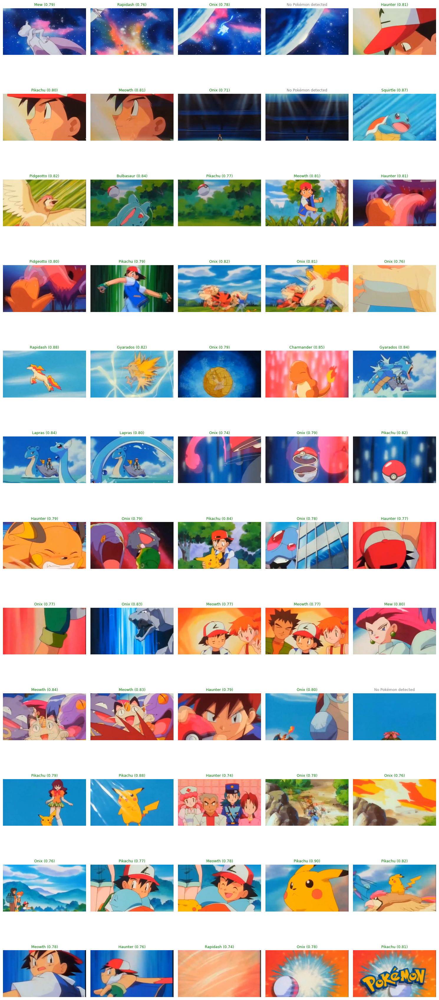

In [ ]:
plot_classified_frames(results)

## Step 3: 🔁 Dataset Expansion via Web Search

While the few-shot classifier performs well on Pokémon seen during prototype construction, it struggles with **unseen objects**  
like Ash or a Pokéball, which are not part of the original support set.

To address this limitation:

- 🌐 We demonstrate how to collect additional data using **web search**.
- 📸 This strategy is useful for expanding support sets for underrepresented or missing classes.
- ⚠️ Careful dataset curation is essential to ensure data quality and class relevance (e.g., Ash often appears with Pokémon or other people).

This approach enables future improvements in recognition performance by filling critical data gaps.

In [ ]:
from duckduckgo_search import DDGS
import requests
from io import BytesIO

def search_and_display_images(query, max_results=30, cols=5, timeout=5):
    """
    Searches and displays images using DuckDuckGo for the given query.

    Args:
        query (str): Search term.
        max_results (int): Max number of image results to fetch.
        cols (int): Number of images per row in the display.
        timeout (int): Timeout in seconds for each image download.

    Returns:
        list of PIL.Image: The downloaded images.
    """
    print(f"🔎 Searching for: {query} ({max_results} results)")

    # Step 1: Search
    image_urls = []
    with DDGS() as ddgs:
        results = ddgs.images(query, max_results=max_results)
        image_urls = [r["image"] for r in results]

    # Step 2: Download images
    downloaded_images = []
    for url in image_urls:
        try:
            response = requests.get(url, timeout=timeout)
            img = Image.open(BytesIO(response.content)).convert("RGB")
            downloaded_images.append(img)
        except Exception as e:
            print(f"❌ Failed to load image from {url}: {e}")

    print(f"✅ Downloaded {len(downloaded_images)} image(s)")

    # Step 3: Display
    n = len(downloaded_images)
    rows = (n + cols - 1) // cols

    plt.figure(figsize=(cols * 3, rows * 3))
    for i, img in enumerate(downloaded_images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Image {i+1}")
    plt.tight_layout()
    plt.show()

    return downloaded_images

**📊 Based on the visualization of the obtained images, the following needs to be noted:**

- When collecting additional data, careful dataset curation is essential to ensure quality and relevance.  
- As seen in these Ash examples, many images include other elements such as Pokémon or additional characters, which may confuse the model.  
- It is also important to match the visual style, scale, and composition of the test data to maintain consistency and avoid domain shift.


🔎 Searching for: Ash (20 results)
✅ Downloaded 20 image(s)


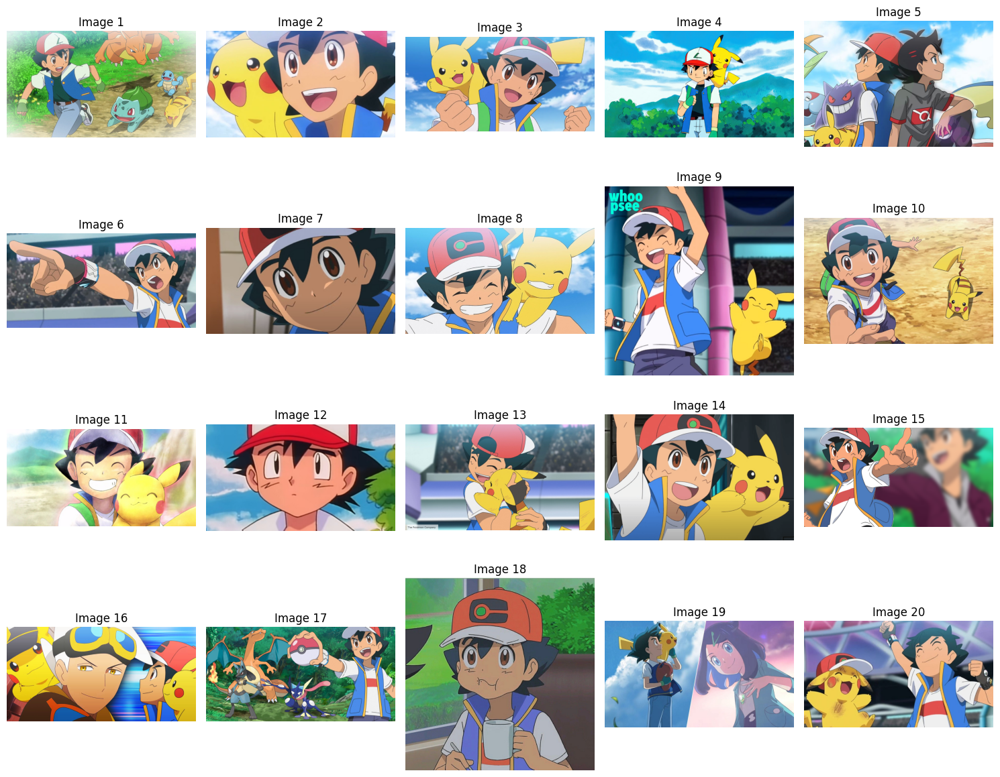

🔎 Searching for: Pokeball (20 results)


/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


✅ Downloaded 20 image(s)


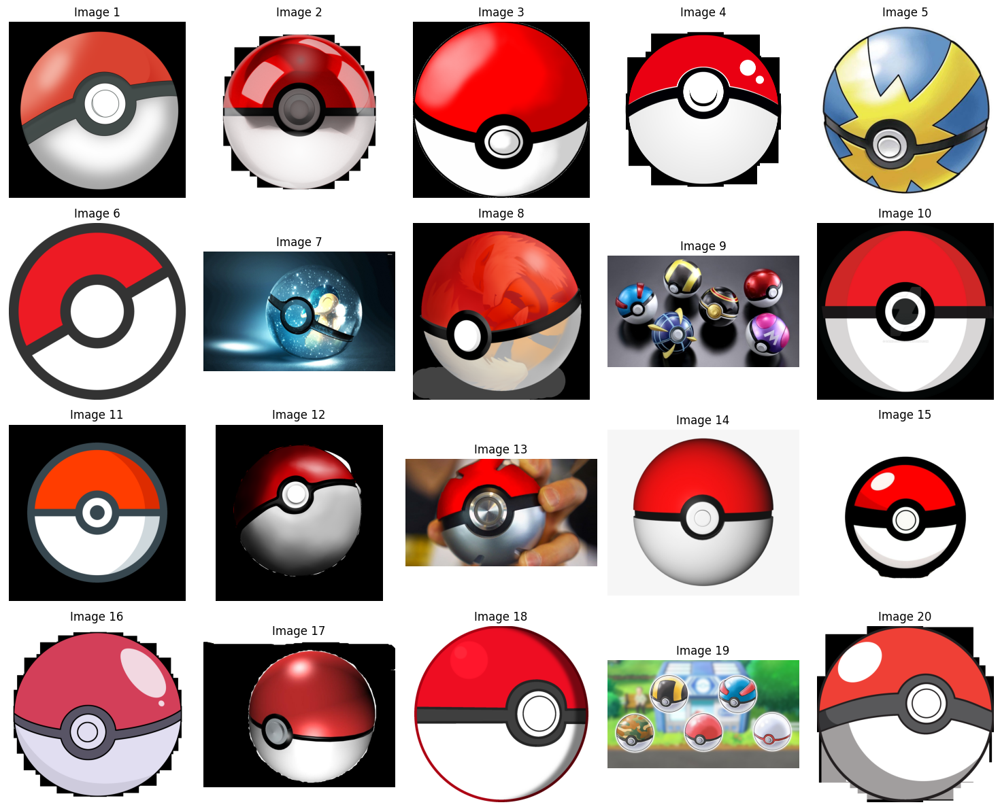

In [ ]:
ash_images = search_and_display_images("Ash", max_results=20)
pokeball_images = search_and_display_images("Pokeball", max_results=20)

## Step 4: 🕵️ Zero-Shot Object Detection with Grounding DINO

This step introduces **Grounding DINO**, a vision-language model that enables **zero-shot object detection** using natural language prompts—no fine-tuning required.

- 📝 Prompts like `"a Pokémon"` or specific class names guide the model.
- 🎯 It predicts and localizes relevant objects in each frame by generating bounding boxes.
- 🔍 The approach allows flexible detection without predefined class labels, making it ideal for open-ended scenarios.

Grounding DINO enables detection of characters and objects directly from text, bridging visual and linguistic understanding.

In [ ]:
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection
import matplotlib.patches as patches

# Define colors for bounding boxes
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

# Load model and processor once
model_id = "IDEA-Research/grounding-dino-base"

device = "cuda" if torch.cuda.is_available() else "cpu"
processor_grounding_dino = AutoProcessor.from_pretrained(model_id)
model_grounding_dino = AutoModelForZeroShotObjectDetection.from_pretrained(model_id).to(device)

In [ ]:
from google.colab.patches import cv2_imshow

def detect_and_plot_pokemon(image_path, prompt, processor_grounding_dino, model_grounding_dino, output_folder_path=None, show_image=True):
    # Load image as RGB, then convert to BGR for OpenCV
    image_pil = Image.open(image_path).convert("RGB")
    image = np.array(image_pil)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    # Run processor and model
    inputs = processor_grounding_dino(images=image_pil, text=prompt, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model_grounding_dino(**inputs)

    results = processor_grounding_dino.post_process_grounded_object_detection(
        outputs,
        inputs.input_ids,
        threshold=0.4, # box_threshold
        text_threshold=0.3,
        target_sizes=[image_pil.size[::-1]]
    )[0]

    boxes = results["boxes"].tolist()
    scores = results["scores"].tolist()
    labels = results["text_labels"] if "text_labels" in results else results["labels"]

    print(f"\n📋 Detection results for: {os.path.basename(image_path)} | Prompt: '{prompt}'")
    for label, score, box in zip(labels, scores, boxes):
        box = [int(x) for x in box]
        print(f"🔎 {label}: {score:.3f} at {box}")

        # Draw rectangle and label
        cv2.rectangle(image, (box[0], box[1]), (box[2], box[3]), (0, 0, 255), 2)
        cv2.putText(image, f"{label}: {score:.2f}", (box[0], box[1] - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 255), 2, cv2.LINE_AA)

    # Save or display
    if output_folder_path:
        os.makedirs(output_folder_path, exist_ok=True)
        output_path = os.path.join(output_folder_path, os.path.basename(image_path))
        cv2.imwrite(output_path, image)
        print(f"💾 Saved to {output_path}")
    elif show_image:
      # Convert back to RGB for correct color in matplotlib
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      plt.figure(figsize=(4, 4))
      plt.imshow(image_rgb)
      plt.axis("off")
      plt.title("Detection Result")
      plt.show()

**✏️ Prompt Sensitivity in Grounding DINO**

The choice of prompt can significantly influence detection performance:

- 🧠 A general prompt like `"pokemon"` results in **higher confidence** and tighter bounding boxes.
- 🧾 Listing specific classes (e.g., `"squirtle, charmander, bulbasaur"`) may yield correct detections, but with **lower confidence** or less optimal localization.
- 🎯 This highlights Grounding DINO’s sensitivity to prompt wording—**phrasing matters** in zero-shot detection tasks.

Careful prompt design can improve both detection accuracy and consistency across frames.


📋 Detection results for: 000223.png | Prompt: 'squirtle. charmander. bulbasaur.'
🔎 charmander: 0.471 at [80, 335, 821, 716]


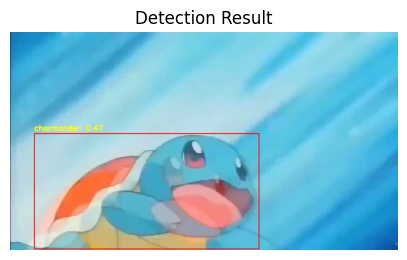


📋 Detection results for: 000223.png | Prompt: 'pikachu. charmander. squirtle. bulbasaur.'


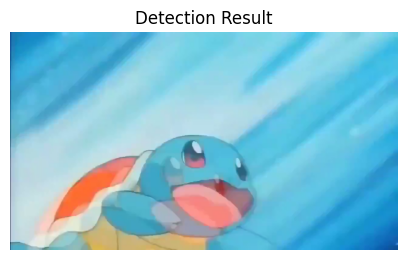


📋 Detection results for: 000223.png | Prompt: 'pokemon.'
🔎 pokemon: 0.704 at [69, 336, 817, 716]


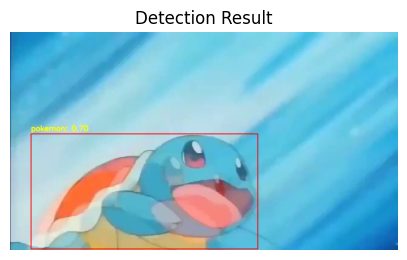

In [ ]:
# Without the class 'pikachu' in the prompt.
detect_and_plot_pokemon(
    image_path="/content/drive/MyDrive/datasets/video_frames/000223.png",
    prompt="squirtle. charmander. bulbasaur.",
    processor_grounding_dino=processor_grounding_dino,
    model_grounding_dino=model_grounding_dino
)

# All the 4 classes are used in the prompt.
detect_and_plot_pokemon(
    image_path="/content/drive/MyDrive/datasets/video_frames/000223.png",
    prompt="pikachu. charmander. squirtle. bulbasaur.",
    processor_grounding_dino=processor_grounding_dino,
    model_grounding_dino=model_grounding_dino
)

# Only the class 'pokemon' is added in the prompt.
detect_and_plot_pokemon(
    image_path="/content/drive/MyDrive/datasets/video_frames/000223.png",
    prompt="pokemon.",
    processor_grounding_dino=processor_grounding_dino,
    model_grounding_dino=model_grounding_dino
)


📋 Detection results for: 000586.png | Prompt: 'pikachu. charmander. squirtle. bulbasaur.'
🔎 pikachu: 0.449 at [369, 107, 1080, 717]


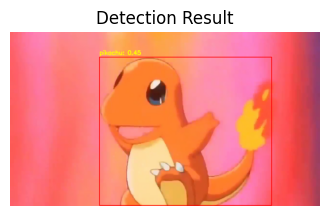

In [ ]:
detect_and_plot_pokemon(
    image_path="/content/drive/MyDrive/datasets/video_frames/000586.png",
    prompt="pikachu. charmander. squirtle. bulbasaur.",
    processor_grounding_dino=processor_grounding_dino,
    model_grounding_dino=model_grounding_dino
)

**👥 Adding 'Person' to the Prompt**

- When no Pokémon are present but a person is visible, adding `"person"` to the prompt helps guide the model.
- 🧭 This improves relevance by reducing false positives and enabling more accurate detections.
- 📌 In this example, the original prompt predicts a Pokémon; the updated prompt correctly identifies a person instead.


📋 Detection results for: 000090.png | Prompt: 'pokemon.'
🔎 pokemon: 0.609 at [173, 1, 1276, 716]


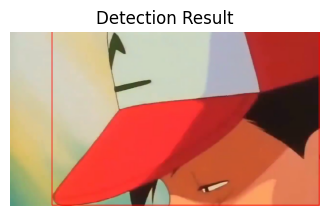


📋 Detection results for: 000090.png | Prompt: 'pokemon. person.'
🔎 person: 0.554 at [174, 1, 1277, 717]


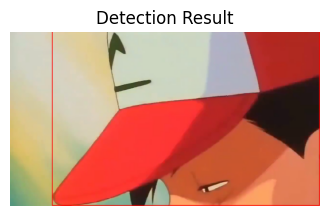

In [ ]:
detect_and_plot_pokemon(
    image_path="/content/drive/MyDrive/datasets/video_frames/000090.png",
    prompt="pokemon.",
    processor_grounding_dino=processor_grounding_dino,
    model_grounding_dino=model_grounding_dino
)

detect_and_plot_pokemon(
    image_path="/content/drive/MyDrive/datasets/video_frames/000090.png",
    prompt="pokemon. person.",
    processor_grounding_dino=processor_grounding_dino,
    model_grounding_dino=model_grounding_dino
)

In [ ]:
from datetime import datetime
import glob

# Input settings
input_folder = "/content/drive/MyDrive/datasets/video_frames"
frame_interval = 15
prompt= "a person. a pokemon."

# Create timestamped output folder
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
output_folder = f"/content/drive/MyDrive/datasets/annotated_frames_{timestamp}"
os.makedirs(output_folder, exist_ok=True)
print(f"📂 Output folder: {output_folder}")

# Get image files
image_paths = sorted(glob.glob(os.path.join(input_folder, "*.png")))

# Process every n-th frame
for i, image_path in enumerate(image_paths):

    if i % frame_interval != 0:
        continue
    # print(f"\n🖼️ Processing frame {i}/{len(image_paths)}: {os.path.basename(image_path)}")
    try:
        detect_and_plot_pokemon(image_path, prompt, processor_grounding_dino, model_grounding_dino, output_folder_path=output_folder)
    except Exception as e:
        print(f"❌ Error processing {image_path}: {e}")

📂 Output folder: /content/drive/MyDrive/datasets/annotated_frames_20250602_212321

📋 Detection results for: 000000.png | Prompt: 'a person. a pokemon.'
🔎 a pokemon: 0.432 at [225, 186, 1271, 714]
💾 Saved to /content/drive/MyDrive/datasets/annotated_frames_20250602_212321/000000.png

📋 Detection results for: 000015.png | Prompt: 'a person. a pokemon.'
🔎 a person: 0.521 at [117, 117, 537, 485]
🔎 a pokemon: 0.551 at [117, 118, 539, 483]
💾 Saved to /content/drive/MyDrive/datasets/annotated_frames_20250602_212321/000015.png

📋 Detection results for: 000030.png | Prompt: 'a person. a pokemon.'
💾 Saved to /content/drive/MyDrive/datasets/annotated_frames_20250602_212321/000030.png

📋 Detection results for: 000045.png | Prompt: 'a person. a pokemon.'
🔎 a pokemon: 0.499 at [626, 74, 865, 371]
💾 Saved to /content/drive/MyDrive/datasets/annotated_frames_20250602_212321/000045.png

📋 Detection results for: 000060.png | Prompt: 'a person. a pokemon.'
🔎 a person: 0.409 at [634, 94, 1276, 448]
🔎 a pok

**🖼️ Visualizing Grounding DINO Detection Results**

- The model correctly detects a variety of Pokémon (e.g., Squirtle, Rapidash, Lapras) and occasionally persons (e.g., Ash, Team Rocket) when the "person" class is included in the prompt.
- It handles multi-object scenes reasonably well, identifying multiple characters in the same frame in some cases.
- However, it still struggles in crowded scenes—often missing one or more objects when both Pokémon and people appear together.
- The model also confuses Pokéballs with Pokémon, even when "pokeball" is explicitly included in the prompt.
- Some bounding boxes are imprecise or attached to the wrong object, especially when characters are occluded or small.

![Grounding DINO Zero-Shot Detection.](https://raw.githubusercontent.com/dimitrisdais/generative-ai-lab/main/assets/images/grounding_dino_zero_shot_detection.png)

In [ ]:
def display_images_from_paths(image_paths, cols=5):
    """
    Display up to 10 images in a 5x2 grid from given image file paths.

    Args:
        image_paths (list of str or Path): List of image file paths.
        cols (int): Number of images per row (default 5).
    """
    assert len(image_paths) <= 10, "This function is designed for up to 10 images."

    images = []
    for path in image_paths:
        try:
            img = Image.open(path).convert("RGB")
            images.append(img)
        except Exception as e:
            print(f"❌ Failed to load {path}: {e}")

    n = len(images)
    rows = (n + cols - 1) // cols

    plt.figure(figsize=(cols * 3, rows * 3))
    for i, img in enumerate(images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Image {i+1}")
    plt.tight_layout()
    plt.show()

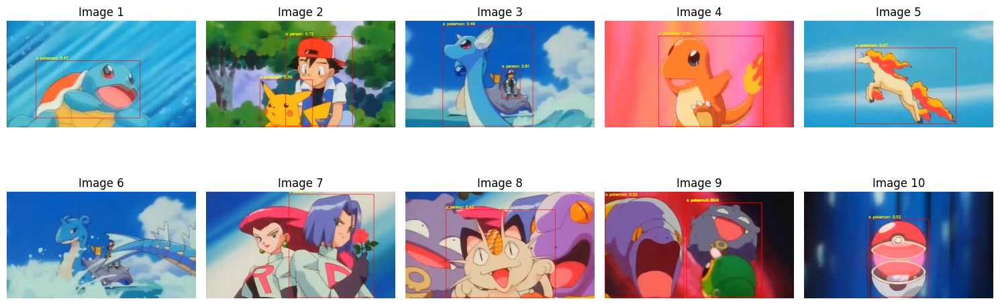

In [ ]:
image_paths = [
    "/content/drive/MyDrive/datasets/annotated_frames_20250602_212321/000225.png",
    "/content/drive/MyDrive/datasets/annotated_frames_20250602_212321/000795.png",
    "/content/drive/MyDrive/datasets/annotated_frames_20250602_212321/000630.png",
    "/content/drive/MyDrive/datasets/annotated_frames_20250602_212321/000585.png",
    "/content/drive/MyDrive/datasets/annotated_frames_20250602_212321/000495.png",
    "/content/drive/MyDrive/datasets/annotated_frames_20250602_212321/000615.png",
    "/content/drive/MyDrive/datasets/annotated_frames_20250602_212321/000990.png",
    "/content/drive/MyDrive/datasets/annotated_frames_20250602_212321/001005.png",
    "/content/drive/MyDrive/datasets/annotated_frames_20250602_212321/000765.png",
    "/content/drive/MyDrive/datasets/annotated_frames_20250602_212321/000720.png",

]
display_images_from_paths(image_paths)

## Step 5: 🧭 Zero-Shot Object Detection with OWLv2

In this step, we explore **OWLv2** to improve upon the detection results obtained with Grounding DINO.

- **OWLv2** (Open-World Learning Vision Transformer) is a more recent vision-language model  
  designed specifically for open-vocabulary object detection.
- It offers key advantages over Grounding DINO:
  - 🔍 A stronger visual backbone
  - 🌐 Broader vision-language training
  - 🎯 Better handling of complex scenes
  - ✏️ Reduced sensitivity to prompt wording

These strengths make OWLv2 a powerful alternative for robust, zero-shot object detection in diverse video frames.

In [ ]:
from transformers import Owlv2Processor, Owlv2ForObjectDetection

# Load OWLv2 model + processor
model_id = "google/owlv2-large-patch14-ensemble"
processor = Owlv2Processor.from_pretrained(model_id)
model = Owlv2ForObjectDetection.from_pretrained(model_id)
model.to(device)

preprocessor_config.json:   0%|          | 0.00/427 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.10k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/67.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/121 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.75G [00:00<?, ?B/s]

Owlv2ForObjectDetection(
  (owlv2): Owlv2Model(
    (text_model): Owlv2TextTransformer(
      (embeddings): Owlv2TextEmbeddings(
        (token_embedding): Embedding(49408, 768)
        (position_embedding): Embedding(16, 768)
      )
      (encoder): Owlv2Encoder(
        (layers): ModuleList(
          (0-11): 12 x Owlv2EncoderLayer(
            (self_attn): Owlv2Attention(
              (k_proj): Linear(in_features=768, out_features=768, bias=True)
              (v_proj): Linear(in_features=768, out_features=768, bias=True)
              (q_proj): Linear(in_features=768, out_features=768, bias=True)
              (out_proj): Linear(in_features=768, out_features=768, bias=True)
            )
            (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
            (mlp): Owlv2MLP(
              (activation_fn): QuickGELUActivation()
              (fc1): Linear(in_features=768, out_features=3072, bias=True)
              (fc2): Linear(in_features=3072, out_features=

In [ ]:
def detect_and_plot_pokemon_owlv2(image_path, prompt_list, output_folder_path=None, show_image=True):
    """
    Run OWLv2 object detection on a single image and optionally save or display results.

    Args:
        image_path (str or Path): Path to the input image.
        prompt_list (list of str): List of text prompts to detect (e.g., ["a pokemon", "a person"]).
        output_folder_path (str or Path, optional): If provided, saves the annotated image to this folder.
        show_image (bool): If True, displays the image inline (e.g., in a Colab notebook).
    """
    # Load image
    image_pil = Image.open(image_path).convert("RGB")
    image = np.array(image_pil)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    # Prepare inputs for OWLv2
    inputs = processor(images=image_pil, text=[prompt_list], return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**inputs)

    # Process predictions
    target_sizes = torch.tensor([image_pil.size[::-1]]).to(device)  # (height, width)
    results = processor.post_process_object_detection(outputs=outputs, target_sizes=target_sizes, threshold=0.2)[0]

    boxes = results["boxes"]
    scores = results["scores"]
    labels = results["labels"]

    print(f"\n📋 Detection results for: {os.path.basename(image_path)}")
    for box, score, label_idx in zip(boxes, scores, labels):
        label = prompt_list[label_idx]
        box = [int(x) for x in box.tolist()]
        print(f"🔎 {label}: {score:.3f} at {box}")

        # Draw bounding box and label
        cv2.rectangle(image, (box[0], box[1]), (box[2], box[3]), (0, 255, 0), 2)
        cv2.putText(image, f"{label}: {score:.2f}", (box[0], box[1] - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 255), 2, cv2.LINE_AA)

    # Save or show
    if output_folder_path:
        os.makedirs(output_folder_path, exist_ok=True)
        out_path = os.path.join(output_folder_path, os.path.basename(image_path))
        cv2.imwrite(out_path, image)
        print(f"💾 Saved to {out_path}")
    elif show_image:
        cv2_imshow(image)

In [ ]:
# Input settings
input_folder = "/content/drive/MyDrive/datasets/video_frames"
frame_interval = 15

prompt= ["a pokemon", "a person", "a pokeball"]

# Create timestamped output folder
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
output_folder = f"/content/drive/MyDrive/datasets/annotated_frames_{timestamp}"
os.makedirs(output_folder, exist_ok=True)
print(f"📂 Output folder: {output_folder}")

# Get image files
image_paths = sorted(glob.glob(os.path.join(input_folder, "*.png")))

# Process every n-th frame
for i, image_path in enumerate(image_paths):

    if i % frame_interval != 0:
        continue
    try:
        detect_and_plot_pokemon_owlv2(image_path, prompt, output_folder_path=output_folder)
    except Exception as e:
        print(f"❌ Error processing {image_path}: {e}")

📂 Output folder: /content/drive/MyDrive/datasets/annotated_frames_20250602_184632

📋 Detection results for: 000000.png
🔎 a pokemon: 0.696 at [241, 209, 1283, 716]
💾 Saved to /content/drive/MyDrive/datasets/annotated_frames_20250602_184632/000000.png

📋 Detection results for: 000015.png
🔎 a pokemon: 0.714 at [127, 127, 530, 474]
💾 Saved to /content/drive/MyDrive/datasets/annotated_frames_20250602_184632/000015.png

📋 Detection results for: 000030.png
💾 Saved to /content/drive/MyDrive/datasets/annotated_frames_20250602_184632/000030.png

📋 Detection results for: 000045.png
💾 Saved to /content/drive/MyDrive/datasets/annotated_frames_20250602_184632/000045.png

📋 Detection results for: 000060.png
🔎 a pokemon: 0.486 at [633, 90, 1275, 440]
🔎 a pokemon: 0.319 at [900, 93, 1279, 436]
💾 Saved to /content/drive/MyDrive/datasets/annotated_frames_20250602_184632/000060.png

📋 Detection results for: 000075.png
💾 Saved to /content/drive/MyDrive/datasets/annotated_frames_20250602_184632/000075.png



**📊 OWLv2 Detection Results: Key Observations**

The OWLv2 model delivers robust results across diverse Pokémon frames using the prompt:  
`["a pokemon", "a person", "a pokeball"]`

- ✅ **Stronger performance** than Grounding DINO, with more accurate box placements and reduced false positives.
- 🧠 Successfully detects objects like **Pokéballs**, which were previously missed or misclassified.
- 🔍 Overlapping boxes or redundant detections could be filtered using **Non-Maximum Suppression (NMS)** for cleaner results.
- ⚙️ Further refinement is possible by tuning the **minimum score threshold** to filter out lower-confidence predictions.
-  💡 Overall, OWLv2 offers a **powerful zero-shot detection solution**—no custom training, yet it generalizes impressively across the Pokémon universe.

![OWLv2 Zero-Shot Detection.](https://raw.githubusercontent.com/dimitrisdais/generative-ai-lab/main/assets/images/owlv2_zero_shot_detection.png)